# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Project Steps
* Camera calibration
* Distortion correction
* Color/gradient threshold
* Perspective transform

---
## 1. the camera calibration using chessboard images

![Distortion Examples](examples/distorted example.png)
![Distortion Examples](examples/distorted example2.png)

![Distortion Examples](examples/Camera Matrix.png)
![Distortion Examples](examples/Convex Lens.png)
![Distortion Examples](examples/Radiial Distortion.png)
![Distortion Examples](examples/tangentail Distortion.png)

\begin{align}
Distortion_{coefficients}&=(k_1, k_2, p_1, p_2, k_3)\\
\end{align}


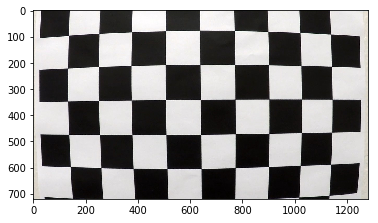

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

test_img = mpimg.imread('camera_cal/calibration1.jpg')
plt.imshow(test_img)

In [2]:
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y
img_size = (test_img.shape[1], test_img.shape[0])


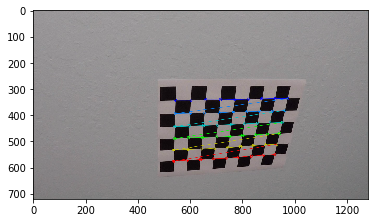

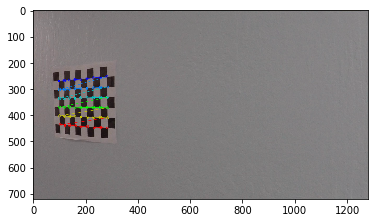

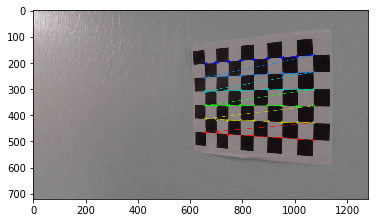

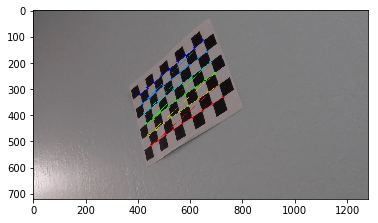

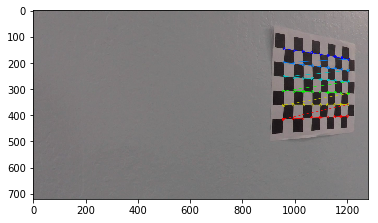

...

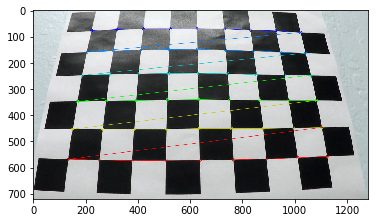

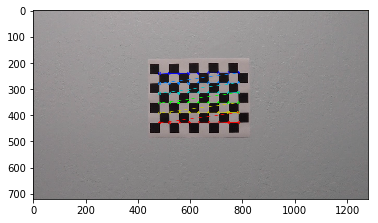

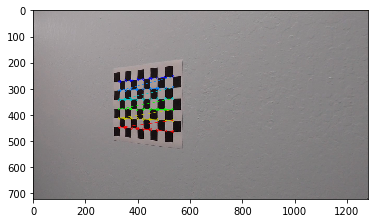

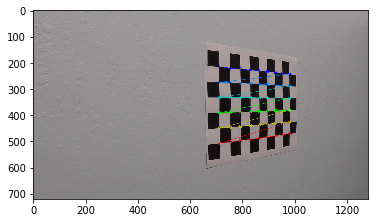

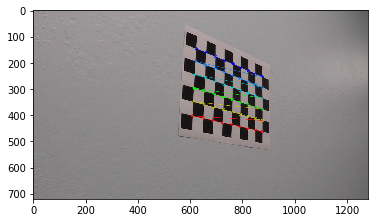

In [3]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        cv2.imwrite('output_images/calibration'+str(i)+'.jpg',img)

        plt.imshow(img)
        plt.show()


## 2. Distortion correction

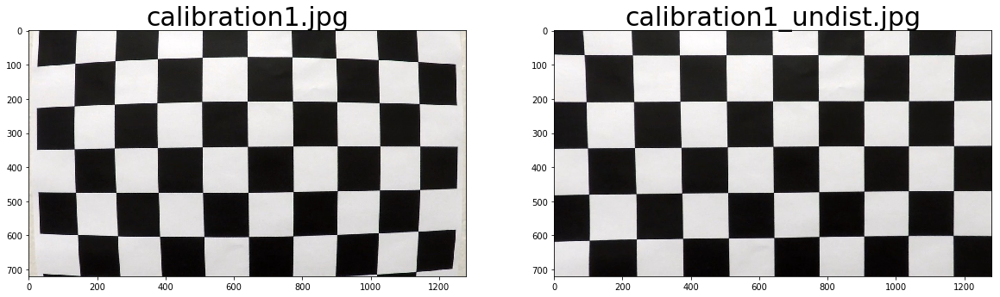

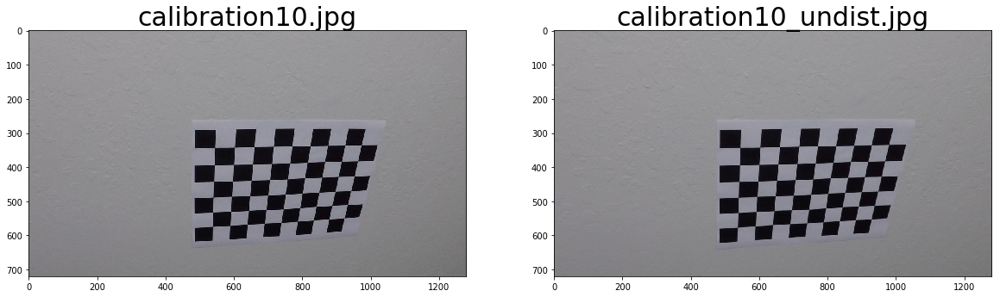

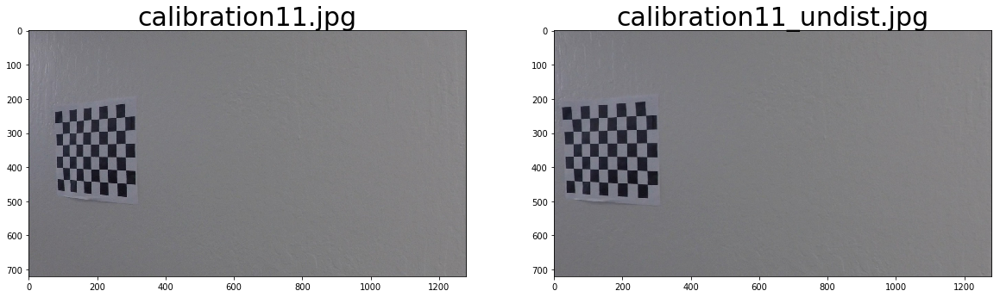

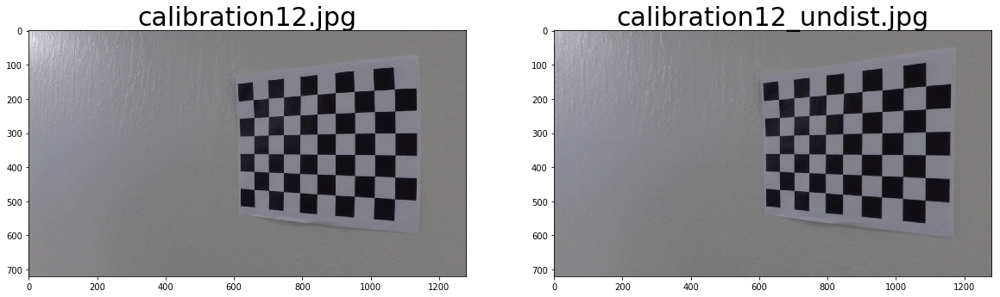

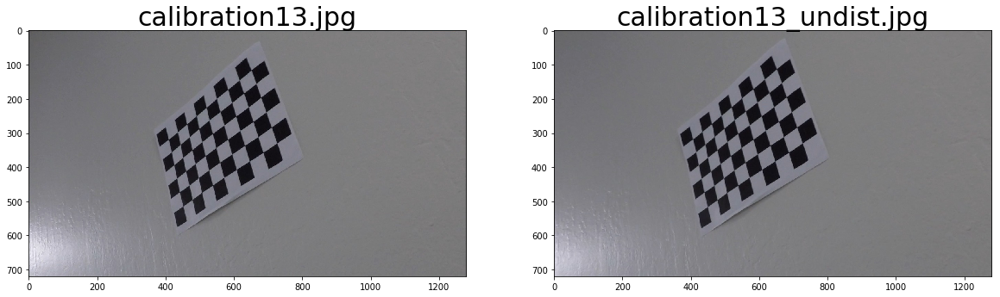

...

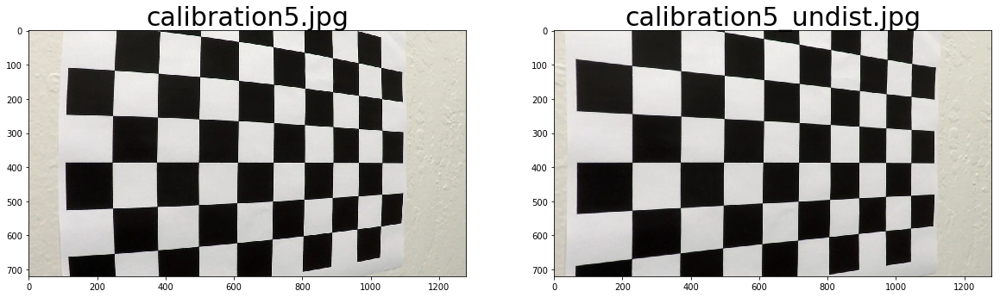

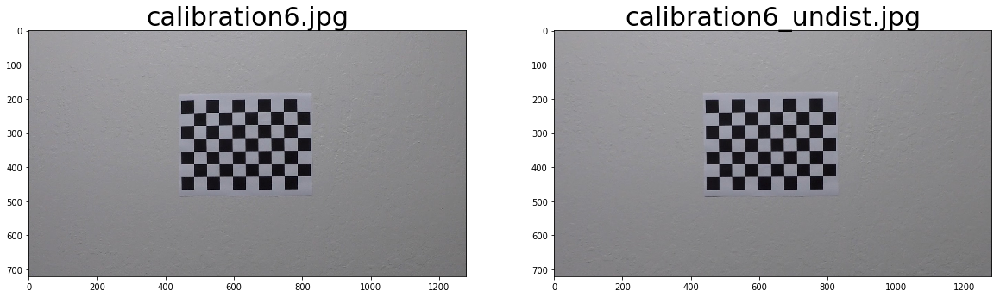

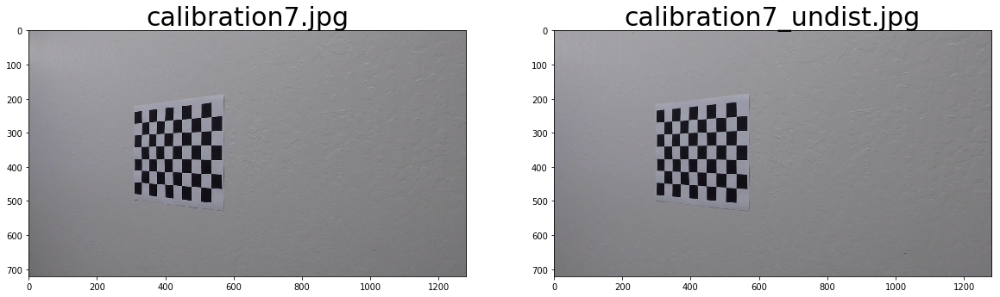

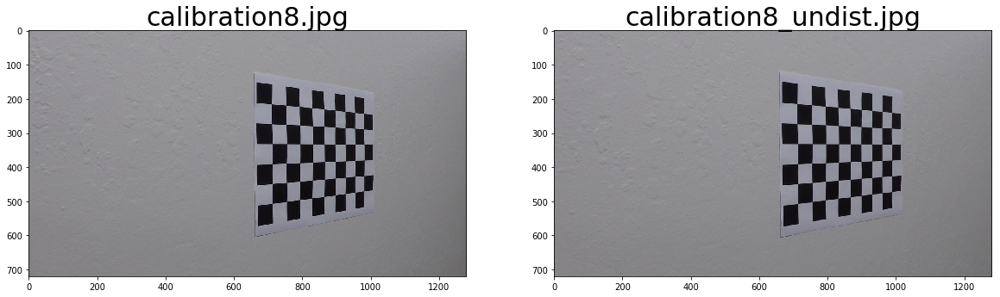

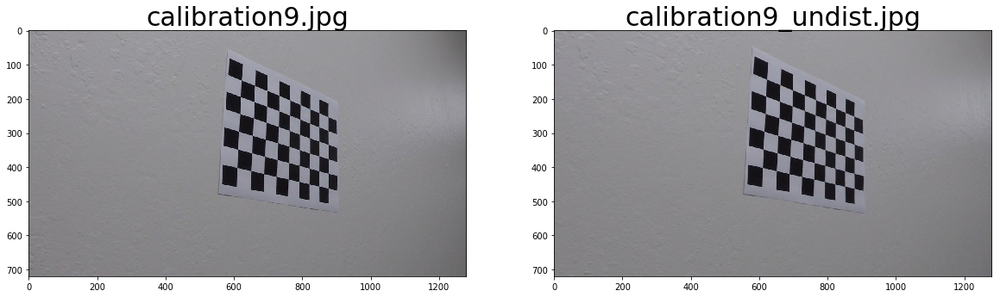

In [4]:
import pickle
images = glob.glob('camera_cal/calibration*.jpg')

for i, fname in enumerate(images):
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    
    title= images[i].split('\\')[1]
    
    #cv2.imwrite('output_images/'+title.split('.')[0]+'_undist.jpg',undist)


    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title(title, fontsize=30)
    ax2.imshow(undist)
    ax2.set_title(title.split('.')[0]+'_undist.jpg', fontsize=30)

plt.savefig('output_images/cal_undist_fig.png')

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "output/wide_dist_pickle.p", "wb" ) )

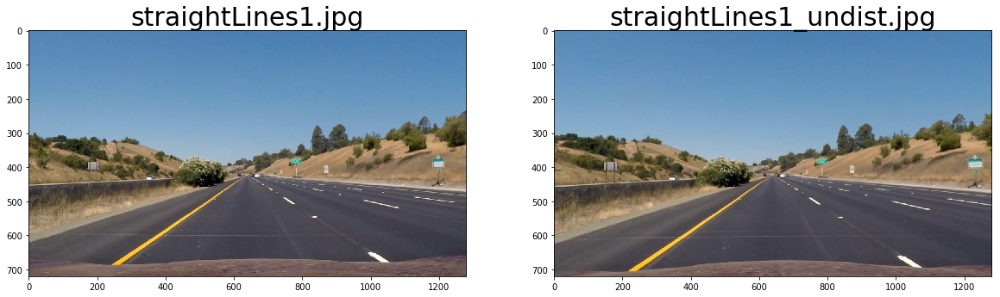

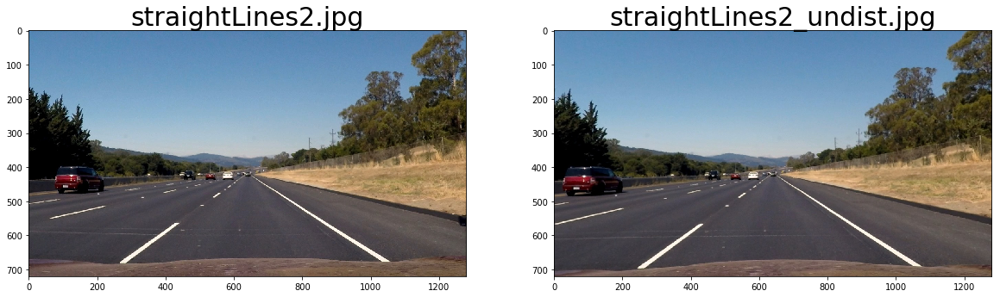

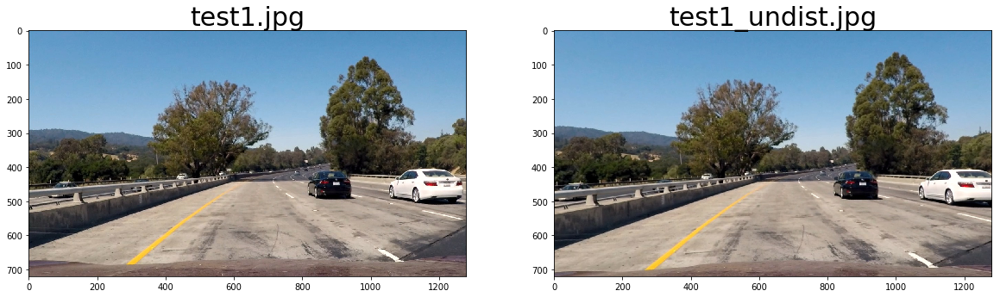

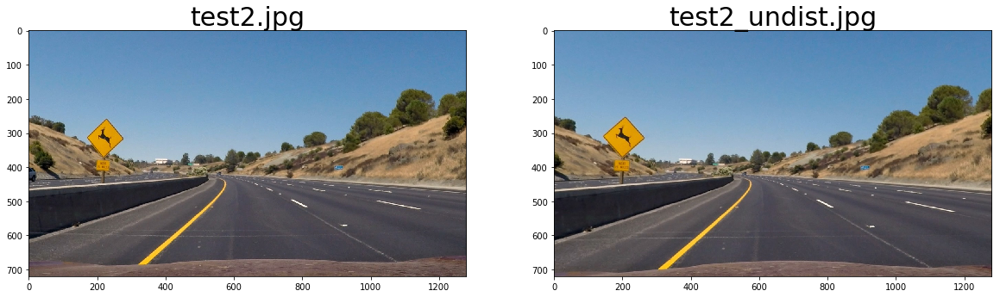

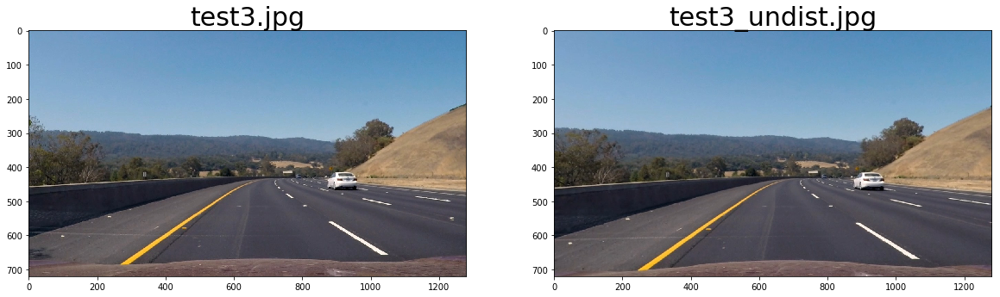

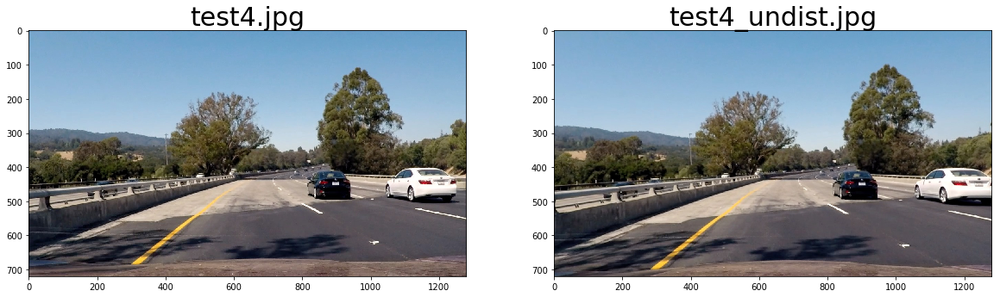

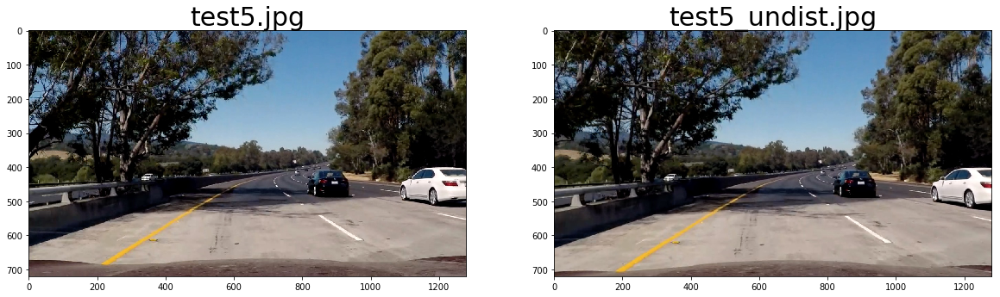

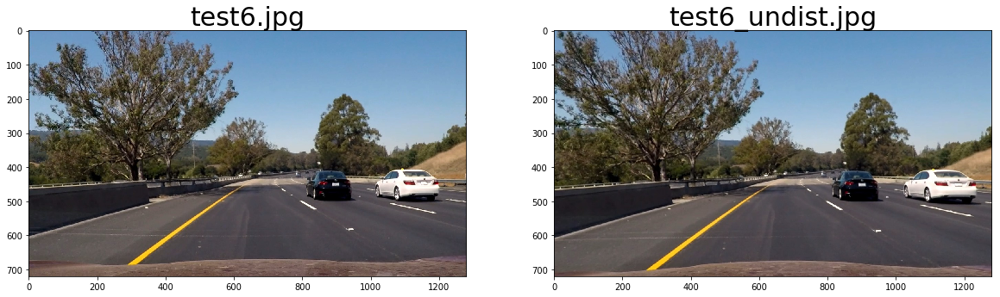

In [5]:
images = glob.glob('test_images/*.jpg')


for i, fname in enumerate(images):
    test_img = cv2.imread(fname)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

    test_img_undist = cv2.undistort(test_img, mtx, dist, None, mtx)
    title= images[i].split('\\')[1]

        
    cv2.imwrite('output_images/'+title.split('.')[0]+'_undist.jpg',test_img_undist)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(test_img)
    ax1.set_title(title, fontsize=30)
    ax2.imshow(test_img_undist)
    ax2.set_title(title.split('.')[0]+'_undist.jpg', fontsize=30)

## 3.Color/gradient threshold
line은 vertical 속성을 갖고 있음.
`cv2.Sobel()`은 Gray만 받음

In [25]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3,thresh=(0,255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

In [26]:
# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


In [27]:
# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [28]:
def threshold(img, color=False, mag_dir_thresh=False):
    """Threshhold image on saturation channel and 
    using magnitude gradient"""
    img = np.copy(img)
    
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    
    
    ## White Color
    lower_white = np.array([0,210,0], dtype=np.uint8)
    upper_white = np.array([255,255,255], dtype=np.uint8)
    white_mask = cv2.inRange(hls, lower_white, upper_white)
    
    ## Yellow Color
    lower_yellow = np.array([18,0,100], dtype=np.uint8)
    upper_yellow = np.array([30,220,255], dtype=np.uint8)
    yellow_mask = cv2.inRange(hls, lower_yellow, upper_yellow)  
    
    combined_binary = np.zeros_like(white_mask)
    
    # Dir Mag Threshold
    if mag_dir_thresh:
        gradx = abs_sobel_thresh(img, orient='x',  thresh=(0, 255))
        grady = abs_sobel_thresh(img, orient='y',  thresh=(0, 255))
        dir_mask = dir_threshold(img)
        mag_mask = mag_thresh(img)
        combined_binary[((gradx == 1) & (grady == 1))|((dir_mask == 1) & (mag_mask == 1))] = 255
        
    if color:
        return np.dstack((white_mask, yellow_mask, combined_binary))
    
    else:
        combined_binary[((white_mask == 255) | (yellow_mask == 255))] = 255
        combined_binary[(combined_binary == 255)] = 1
        return combined_binary

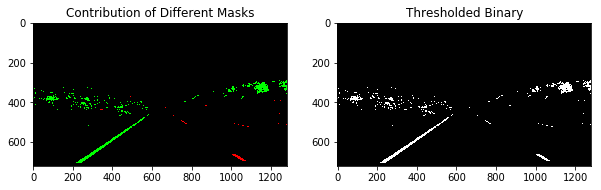

In [10]:
test_img = cv2.imread('output_images\\straightLines1_undist.jpg')

plt.figure(figsize=(10,40))
plt.subplot(1,2,1)
thresholded = threshold(test_img, color=True)
plt.imshow(thresholded)
plt.title('Contribution of Different Masks')

plt.subplot(1,2,2)
b_thresholded = threshold(test_img)
plt.imshow(b_thresholded, cmap='gray')
plt.title('Thresholded Binary')

In [17]:
b_thresholded.max()

1

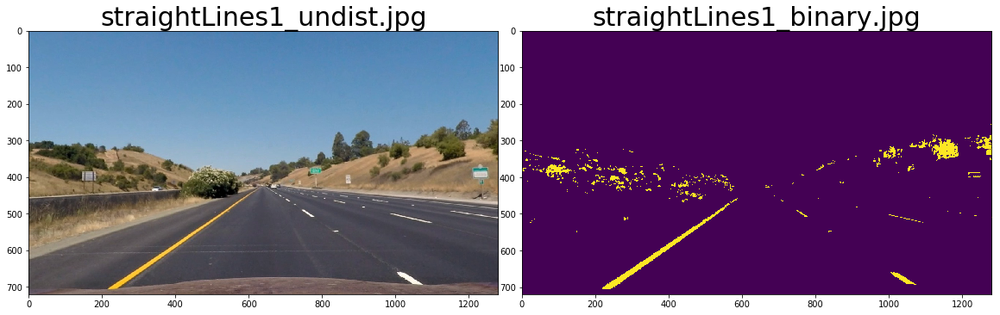

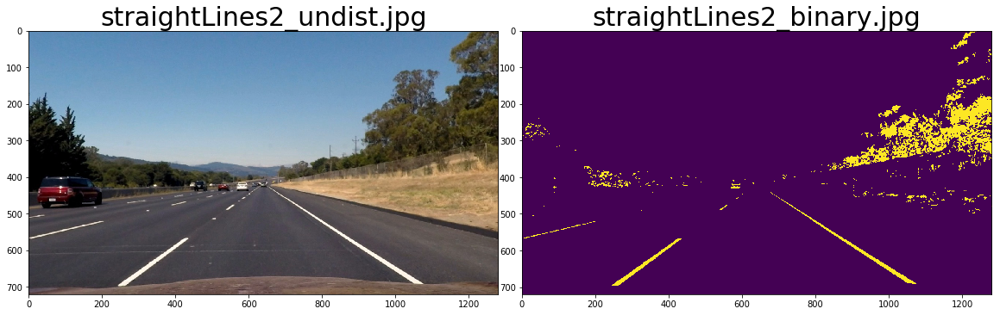

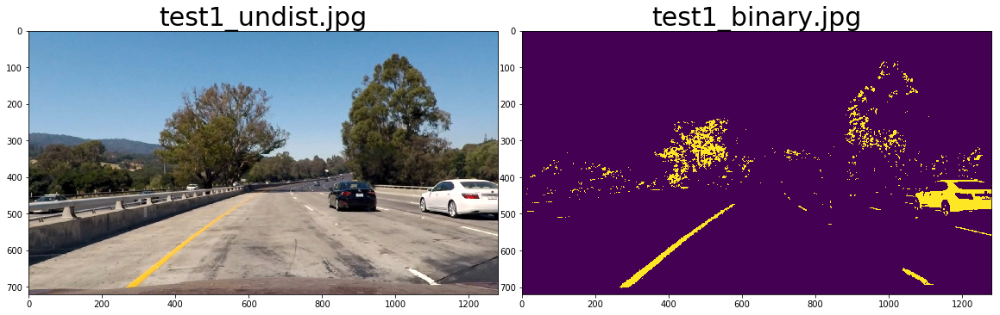

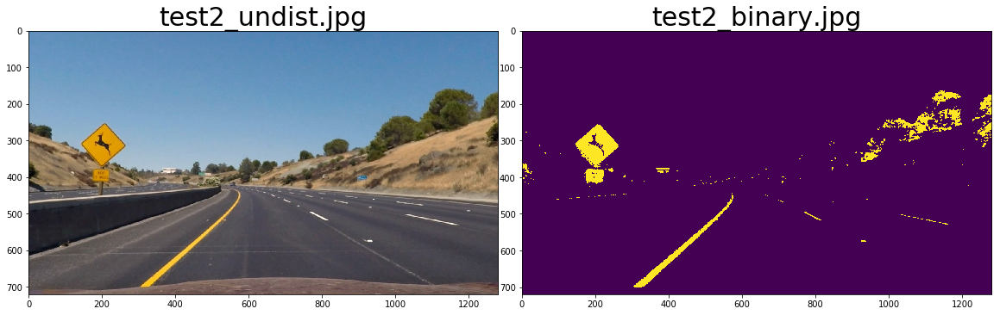

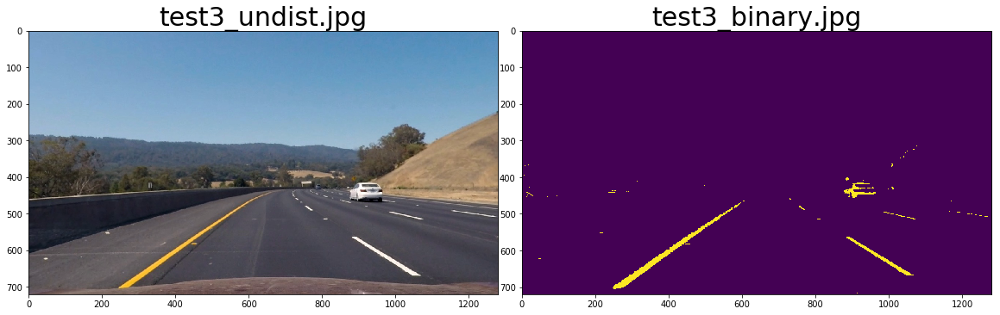

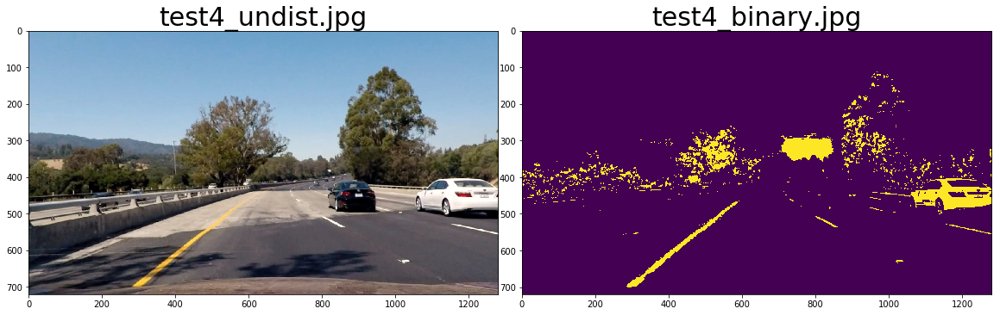

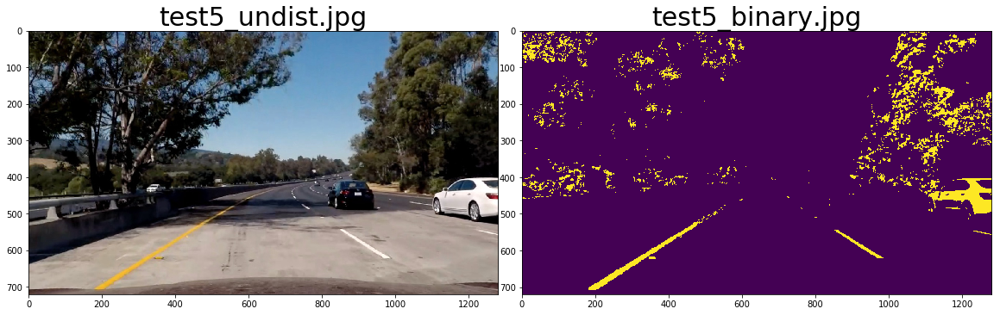

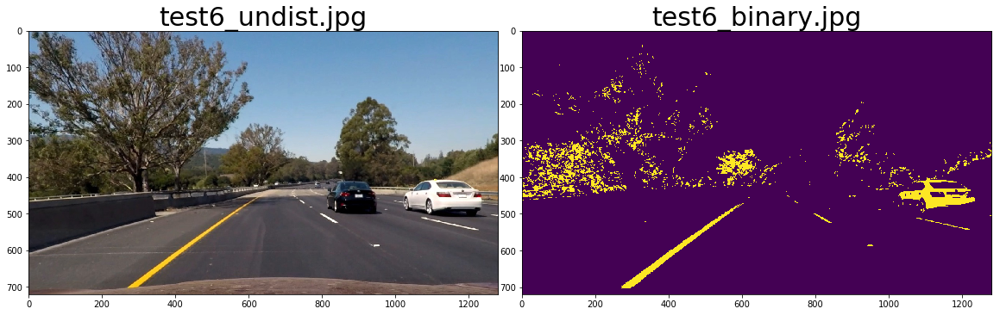

In [18]:
images = glob.glob('output_images/*_undist.jpg')


for i, fname in enumerate(images):
    test_img = cv2.imread(fname)
    
    test_img_binary= threshold(test_img)
    
    title= images[i].split('\\')[1]

        
    cv2.imwrite('output_images/'+title.split('_')[0]+'_binary.jpg',test_img_binary*255)

    # Visualize unwarp
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(test_img)
    ax1.set_ylim([img_size[1],0])
    ax1.set_xlim([0,img_size[0]])
    ax1.set_title(title, fontsize=30)
    ax2.imshow(test_img_binary)
    ax2.set_title(title.split('_')[0]+'_binary.jpg', fontsize=30)

## 4.Perspective Transform

![Distortion Examples](examples/perspective1.png)
![Distortion Examples](examples/perspective2.png)

In [12]:
def unwarp(img, src, dst):
    image_shape = (img.shape[1],img.shape[0])
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, image_shape, flags=cv2.INTER_LINEAR)
    return warped, M, Minv


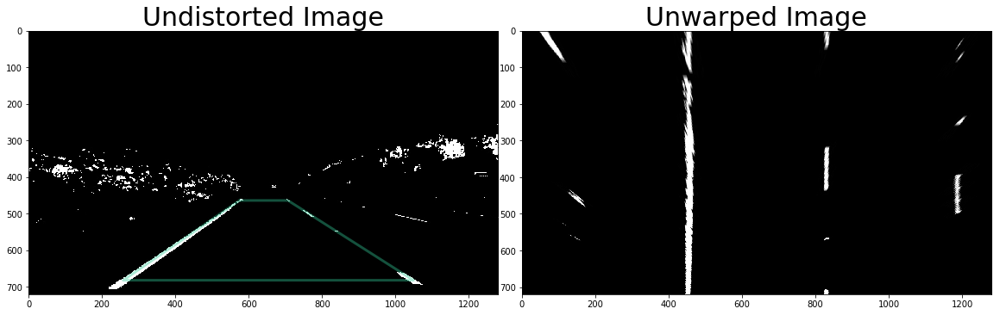

In [19]:
test_img_undist=cv2.imread('output_images/straightLines1_binary.jpg')

# define source and destination points for transform
src = np.float32([(575,464),
                  (707,464), 
                  (258,682), 
                  (1049,682)])
dst = np.float32([(450,0),
                  (img_size[0]-450,0),
                  (450,img_size[1]),
                  (img_size[0]-450,img_size[1])])

test_img_unwarped, M, Minv = unwarp(test_img_undist, src, dst)

# Visualize unwarp
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(test_img_undist)
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color='#33cc99', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([img_size[1],0])
ax1.set_xlim([0,img_size[0]])
ax1.set_title('Undistorted Image', fontsize=30)
ax2.imshow(test_img_unwarped)
ax2.set_title('Unwarped Image', fontsize=30)

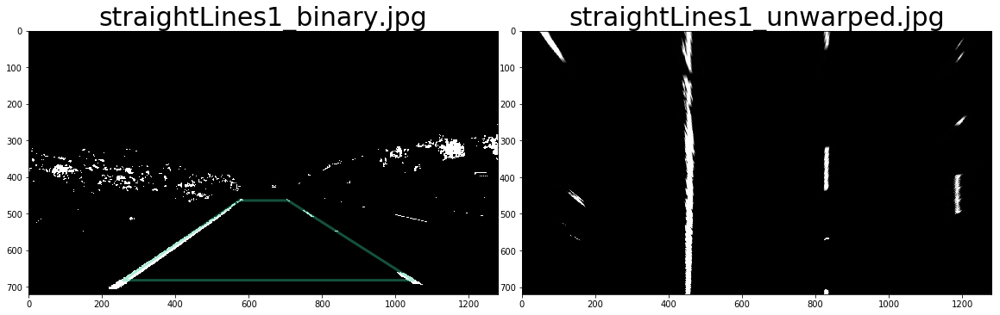

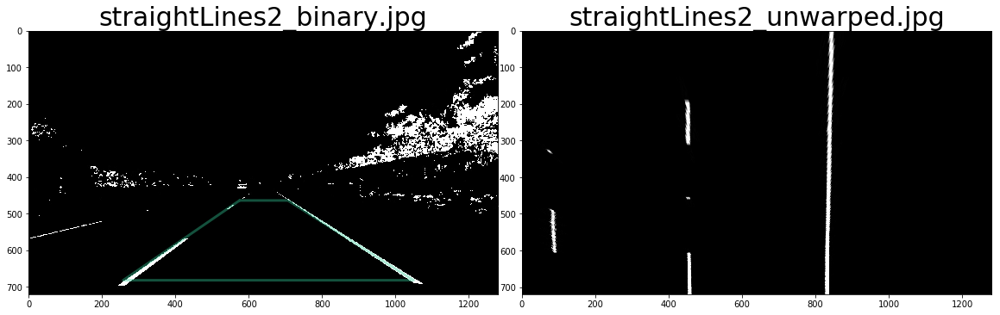

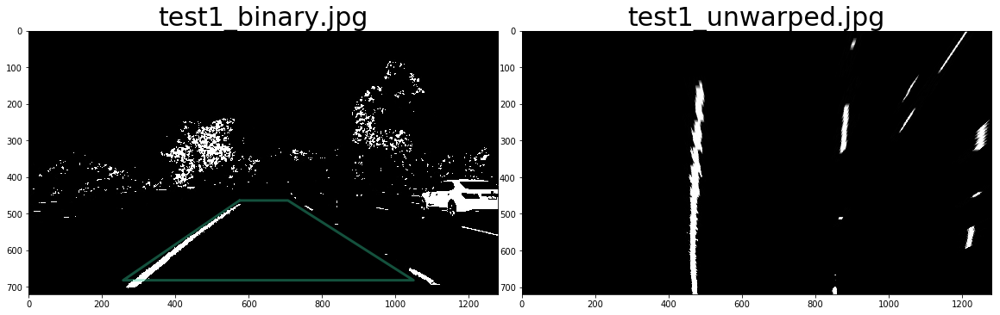

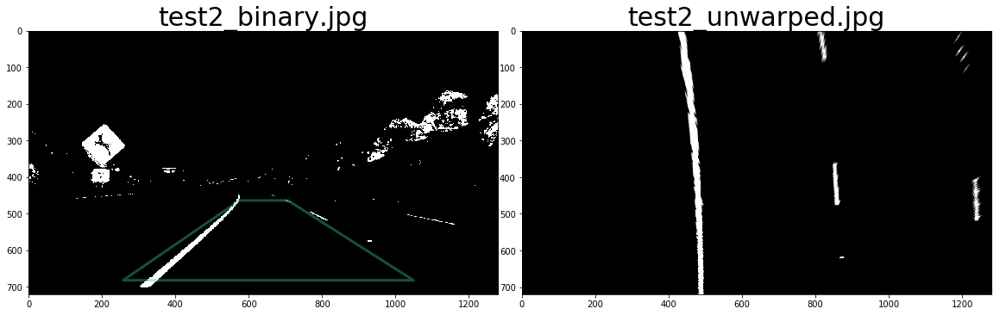

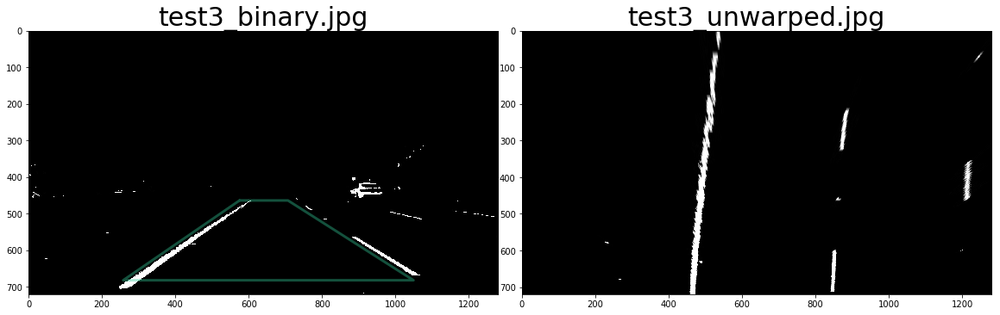

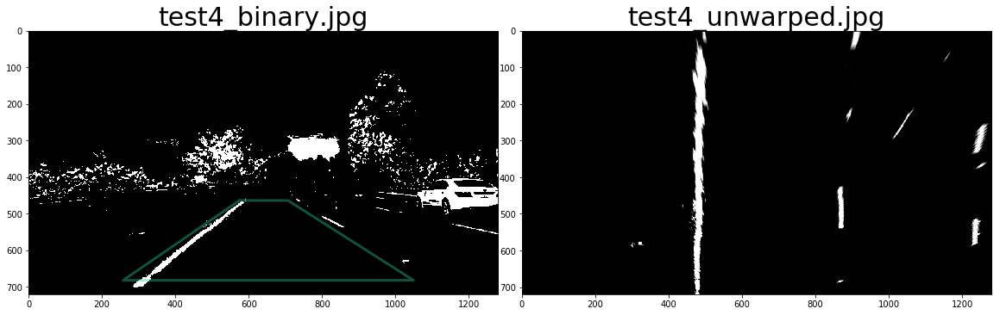

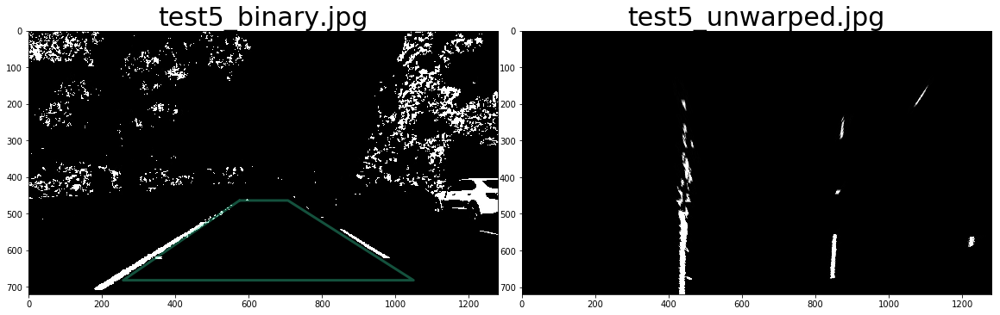

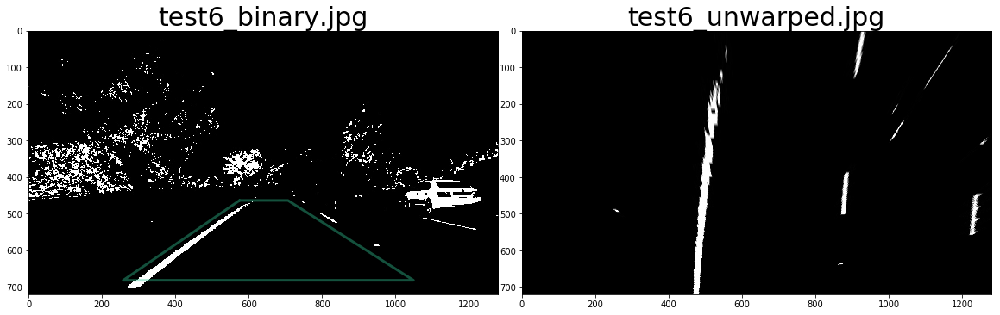

In [21]:
images = glob.glob('output_images/*_binary.jpg')


for i, fname in enumerate(images):
    test_img = cv2.imread(fname)
    
    test_img_unwarped, M, Minv = unwarp(test_img, src, dst)
    
    title= images[i].split('\\')[1]

        
    cv2.imwrite('output_images/'+title.split('_')[0]+'_unwarped.jpg',test_img_undist)

    # Visualize unwarp
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(test_img)
    x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
    y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
    ax1.plot(x, y, color='#33cc99', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
    ax1.set_ylim([img_size[1],0])
    ax1.set_xlim([0,img_size[0]])
    ax1.set_title(title, fontsize=30)
    ax2.imshow(test_img_unwarped)
    ax2.set_title(title.split('_')[0]+'_unwarped.jpg', fontsize=30)

In [ ]:
images